Author: QUILLIO
Customized by: BinhNVH

In [1]:

import copy
import warnings
import numpy as np
import pandas as pd
import cv2
import pydicom
from pydicom.pixel_data_handlers.util import apply_voi_lut
from random import randint
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from ensemble_boxes import *

In [2]:
# Load data
train = pd.read_csv(r'E:\\XR-AI\\datasets\\vinbigdata\\train.csv')
train_orig = copy.deepcopy(train)
sizes = pd.read_csv(r'E:\XR-AI\datasets\vinbigdata\sizes.csv')
sizes = sizes.add_suffix('_sizes')  # add suffix to avoid column overlap
sizes.columns = ['image_id', 'width_sizes', 'height_sizes']
sizes.image_id = sizes.image_id.str[:-4]
train = train.set_index('image_id').join(sizes.set_index('image_id')).reset_index()
class_id_to_name_dict = train[['class_name', 'class_id']].drop_duplicates().iloc[:,[1,0]].set_index('class_id').to_dict()['class_name']


In [3]:
# Translate our bounding boxes into those readable by ZFTurbo and merge
def get_fused_boxes(image_id, records, only_one=False):
    boxes = records[['x_min', 'y_min', 'x_max', 'y_max']].values
    pix_multiplier = pd.DataFrame([records.width,records.height,records.width,records.height]).T
    boxes = [(boxes/(pix_multiplier)).values.tolist()]
    labels = [records["class_id"].tolist()]
    scores = [[1]*len(records)]
    weights = [1]

    iou_thr = 0.4
    skip_box_thr = 0
    sigma = 0.1
    # If we demand only one of the label per image, we set iou threshold to 0
    if only_one:
        boxes, scores, labels = weighted_boxes_fusion(boxes, scores, labels, weights=weights, iou_thr=0, skip_box_thr=skip_box_thr)
    else:
        boxes, scores, labels = weighted_boxes_fusion(boxes, scores, labels, weights=weights, iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    boxes = boxes * pix_multiplier.iloc[:len(boxes),:]
    boxes.columns = ['x_min', 'y_min', 'x_max', 'y_max']
    boxes['class_id'] = labels.astype(int)
    boxes['image_id'] = image_id
    return boxes

In [4]:
# Merge annotations
train_w_finding = train.loc[train.class_id != 14]
train_w_finding_image_ids = list(train_w_finding.image_id.unique())

train_fused = []
# For each image with a finding:
for image_id in train_w_finding_image_ids:
    records = copy.deepcopy(train_w_finding.loc[train_w_finding.image_id == image_id,:])
    # make only one each of cardiomegaly and aortic enlargement boxes
    for class_id in [0,3]:
        idx = records.loc[records.class_id==class_id,:].index
        if len(idx) > 1:
            finding = records.loc[idx,:]
            boxes = get_fused_boxes(image_id, finding, only_one=True)
            train_fused.append(boxes)
            records = records.drop(idx)

    boxes = get_fused_boxes(image_id, records)
    train_fused.append(boxes)

train_fused = pd.concat(train_fused)
train_fused['class_name'] = train_fused.class_id.map(class_id_to_name_dict)
train_fused = train_fused[['image_id','class_name', 'class_id', 'x_min', 'y_min', 'x_max', 'y_max']]
train_fused.to_csv(r'E:\XR-AI\datasets\vinbigdata\wbf_train_data.csv')

In [5]:
# Add 'no findings' back in
no_finding_idx = train.loc[train.class_id == 14].image_id.drop_duplicates().index
no_finding_df = copy.deepcopy(train.iloc[no_finding_idx,:])
no_finding_df[['x_min', 'y_min', 'x_max', 'y_max']] = [0,0,1,1]
no_finding_df = no_finding_df[['image_id','class_name', 'class_id', 'x_min', 'y_min', 'x_max', 'y_max']]
train_fused = pd.concat([no_finding_df,train_fused])
train_fused.to_csv(r'E:\XR-AI\datasets\vinbigdata\wbf_train_data_with_no_findings.csv')

In [9]:
def read_xray(path, rescale_color=True):

    dicom = pydicom.read_file(path)
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        data = apply_voi_lut(dicom.pixel_array, dicom)
    if dicom.PhotometricInterpretation == "MONOCHROME1":
        data = np.amax(data) - data
    if rescale_color:
        data = data - np.min(data)
        data = data / np.max(data)
        data = (data * 255).astype(np.uint8)
    return data

def plot_scale_compare(imageid, t_old, t_new, size=None):
    img = read_xray(r"E:\X-AI\dataset\vinbigdata-chest-xray-abnormalities-detection\train\7b9e4e3ba89ca58d7a0e4e9a13d7dbc4.dicom")
    if size is not None:
        img_new = cv2.resize(img, size)
    else:
        img_new = img

    fig, (ax1, ax2) = plt.subplots(1, 2)
    for t, img, ax in zip([t_old, t_new], [img, img_new], [ax1, ax2]):
        infos = t[t['image_id'] == imageid].sort_values(by='class_id')
        class_ids = infos['class_id'].unique()
        label2color = {class_id:[randint(0,255)/255 for i in range(3)] for class_id in class_ids}
        for index, row in infos.iterrows():
            rec_min = (row['x_min'], row['y_min'])
            color = label2color[row['class_id']]
            rect = patches.Rectangle(rec_min,row['x_max']-row['x_min'],row['y_max']-row['y_min'],
                                     linewidth=2,edgecolor= color,facecolor='none',label=row['class_name'])
            ax.add_patch(rect)
            ax.legend()
        ax.imshow(img, 'gray')
    fig.set_size_inches(22,16)
    plt.show()

000434271f63a053c4128a0ba6352c7f


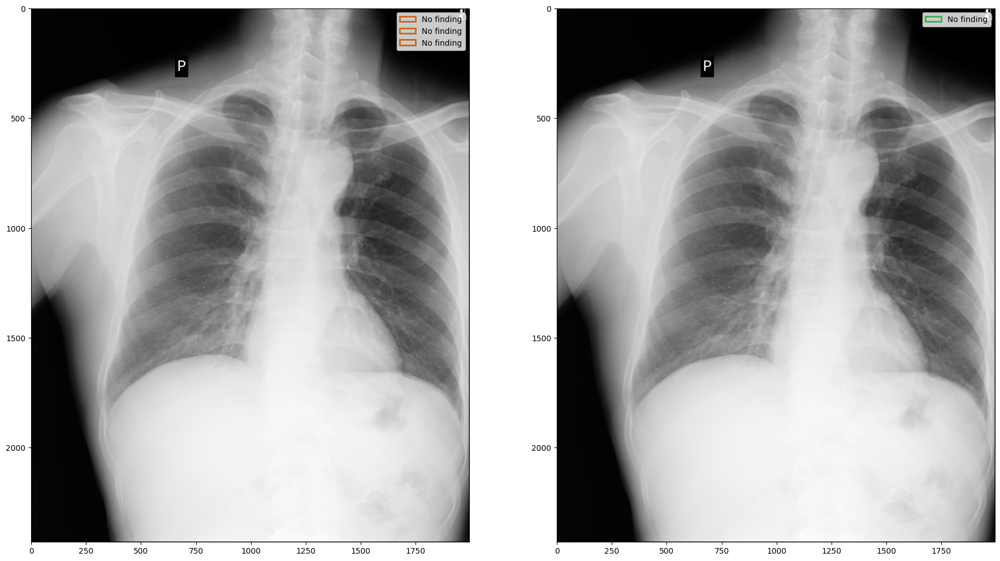

00053190460d56c53cc3e57321387478


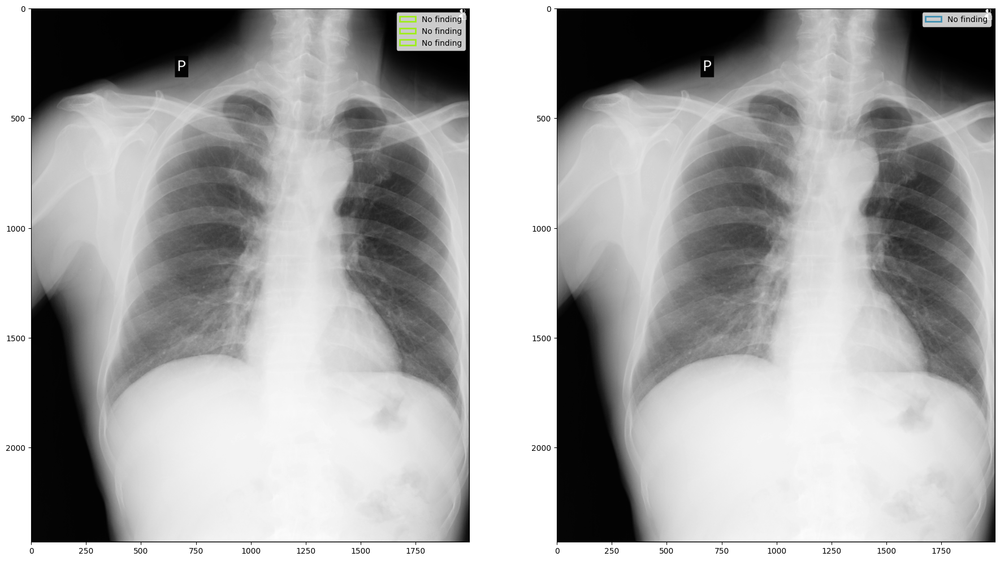

0005e8e3701dfb1dd93d53e2ff537b6e


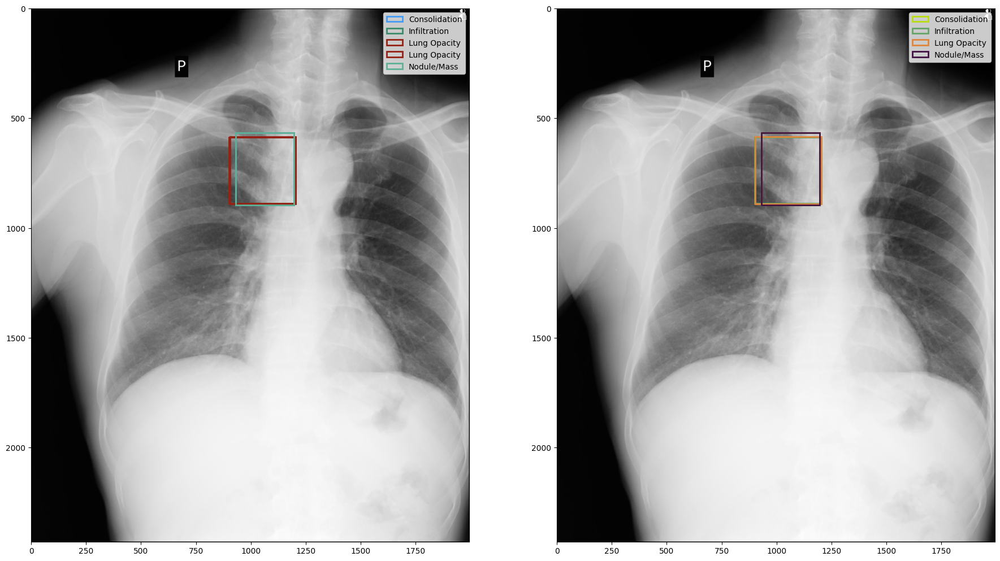

0006e0a85696f6bb578e84fafa9a5607


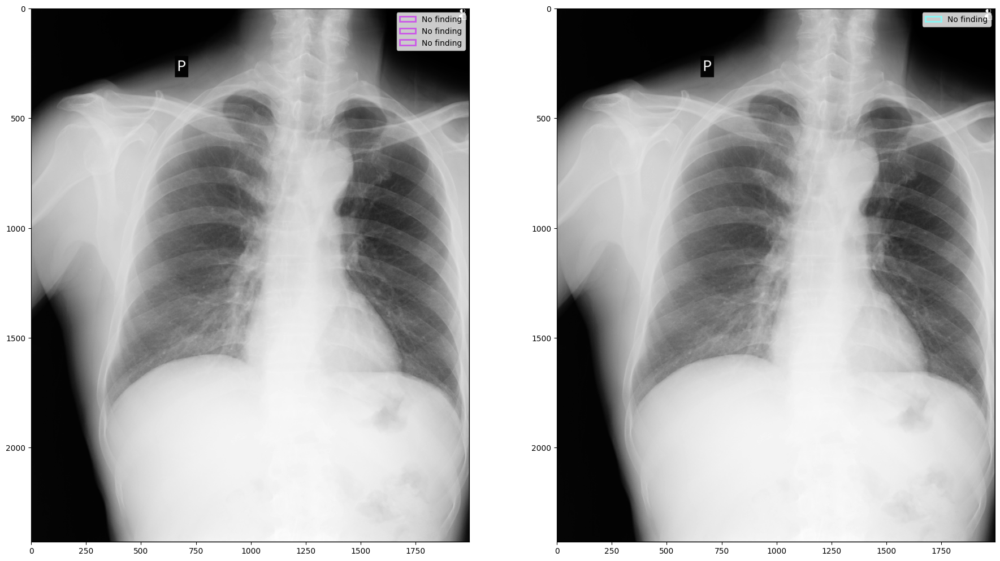

0007d316f756b3fa0baea2ff514ce945


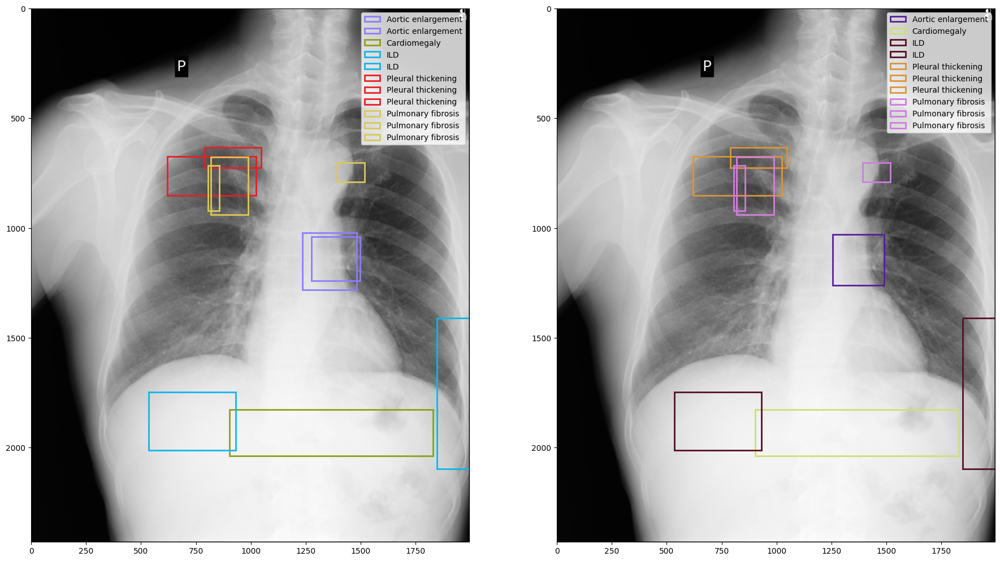

000ae00eb3942d27e0b97903dd563a6e


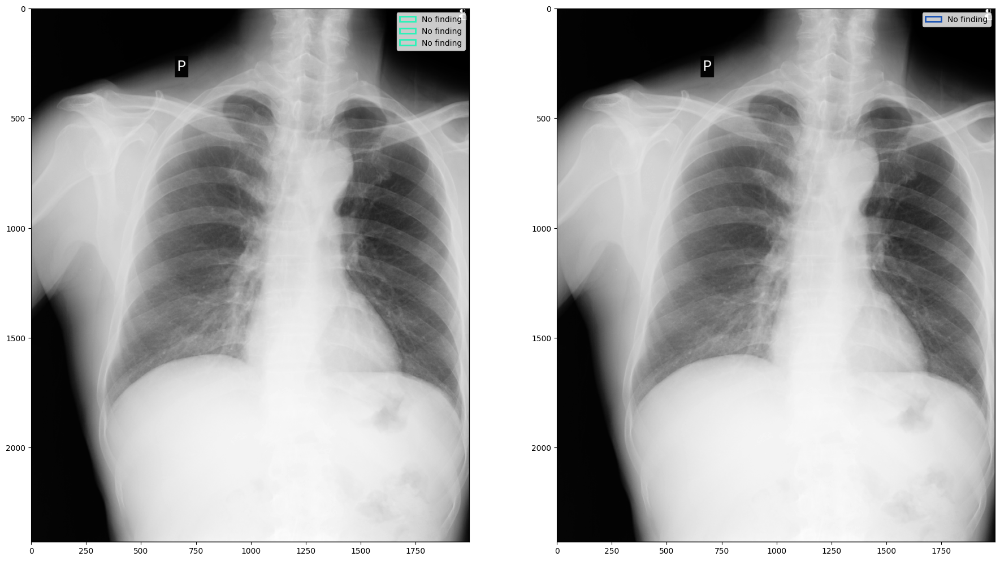

000d68e42b71d3eac10ccc077aba07c1


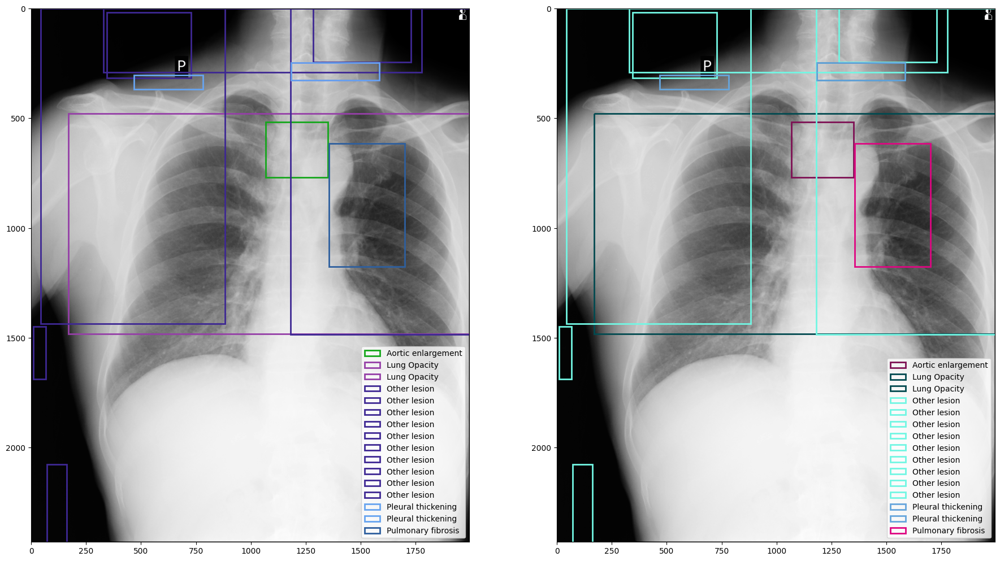

00150343289f317a0ad5629d5b7d9ef9


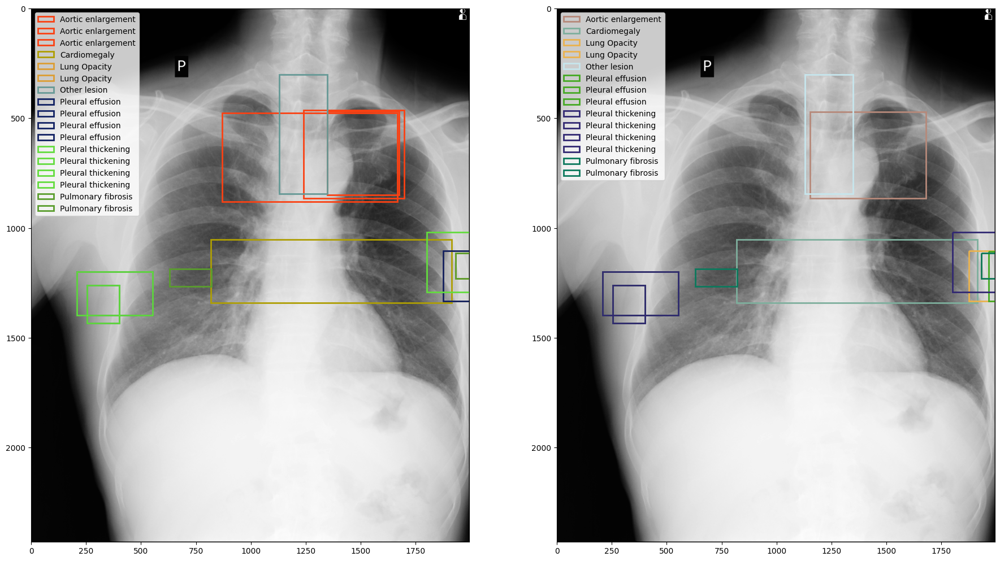

00176f7e1b1cb835123f95960b9a9efd


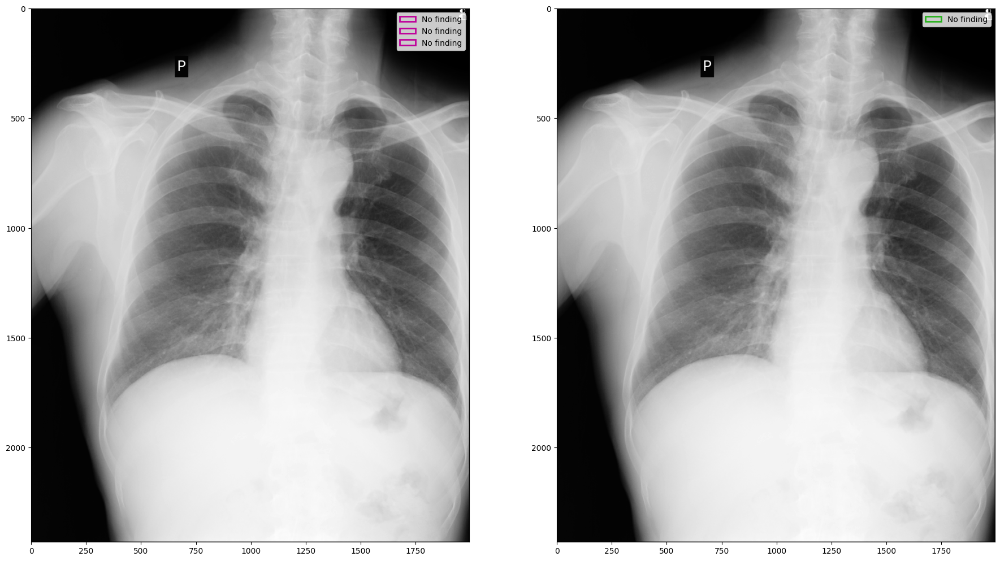

001d127bad87592efe45a5c7678f8b8d


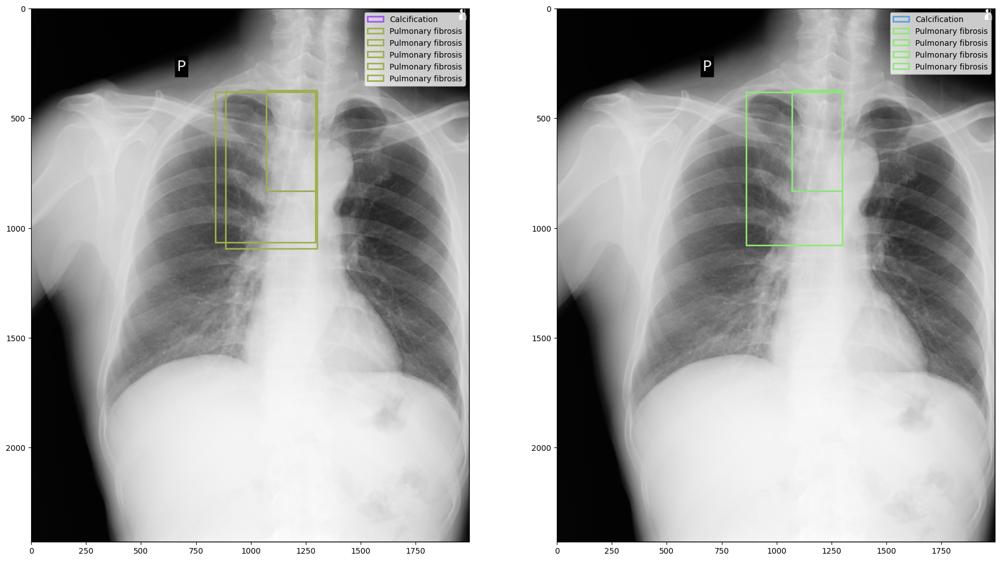

0021df30f3fddef551eb3df4354b1d06


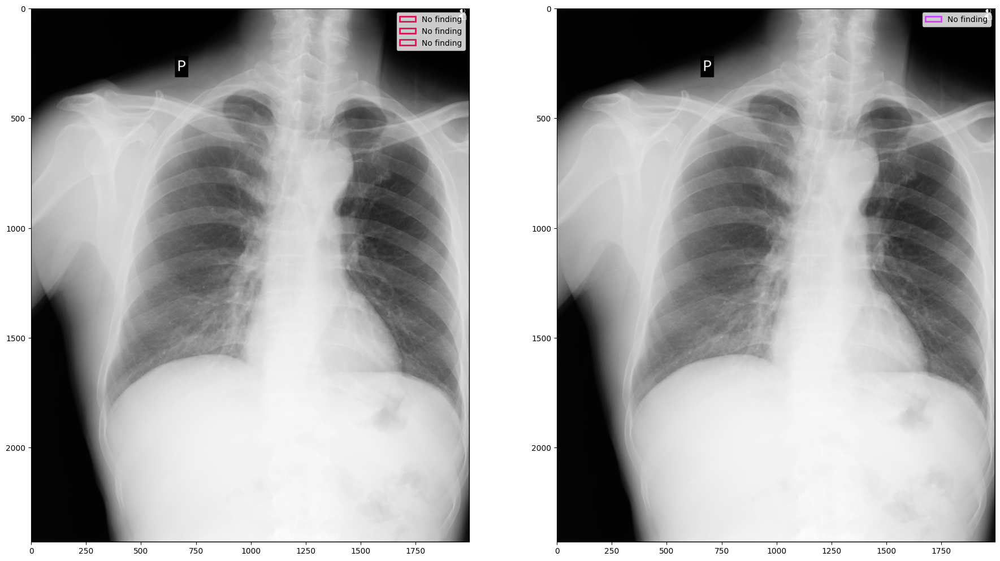

00291f7aff0123ea76a59998effef229


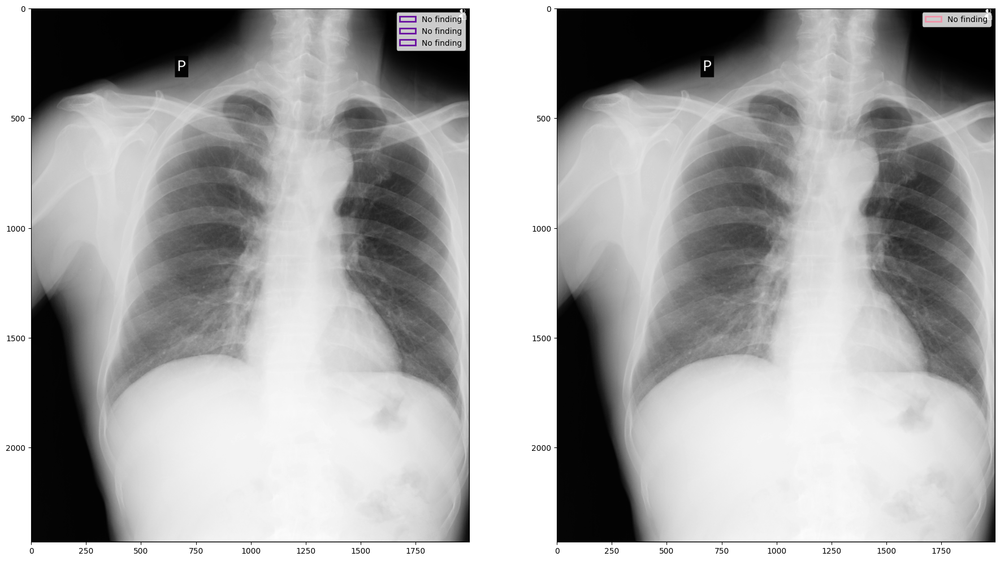

0032c6091dc8f1b1245fc2f5f45458fa


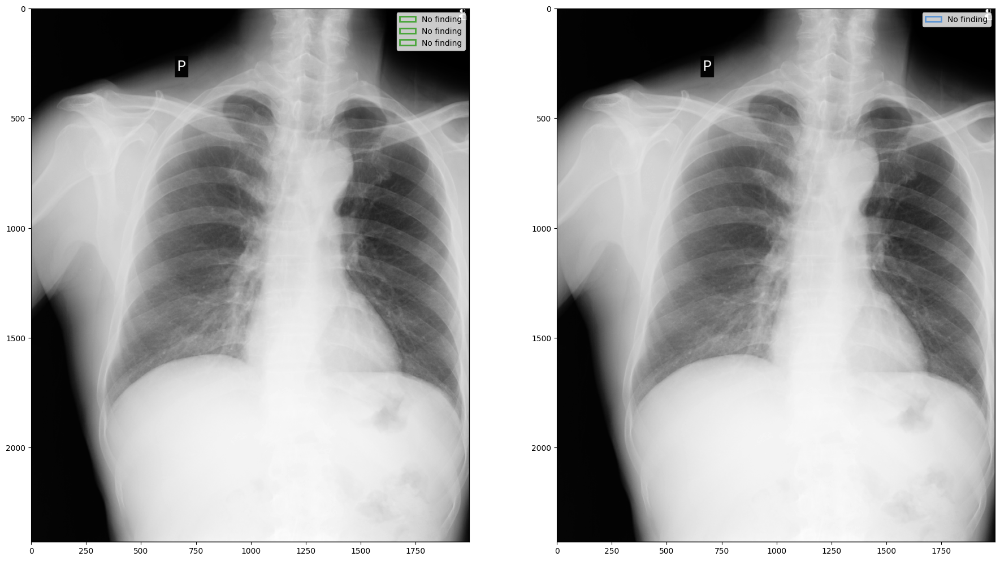

003cfe5ce5c0ec5163138eb3b740e328


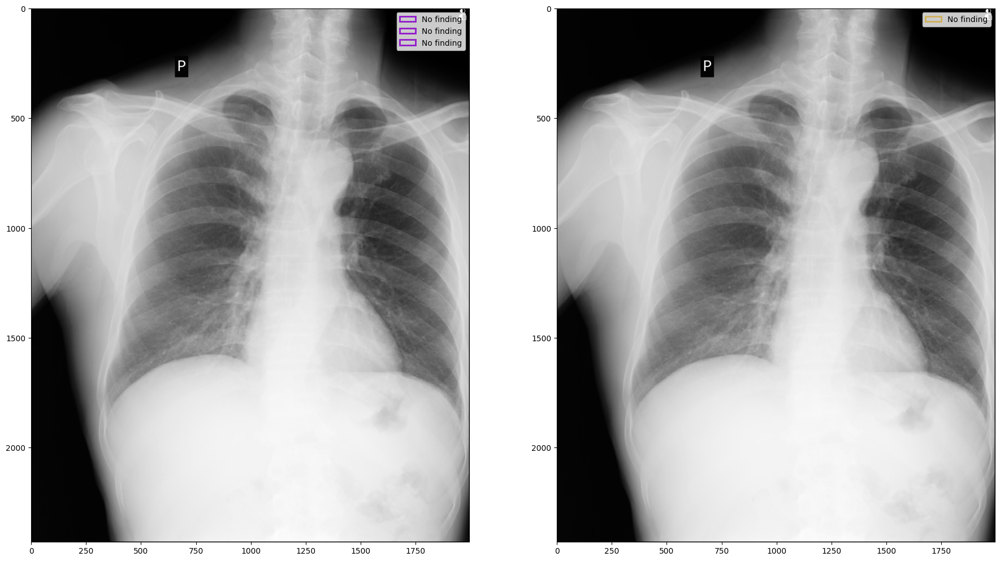

0046f681f078851293c4e710c4466058


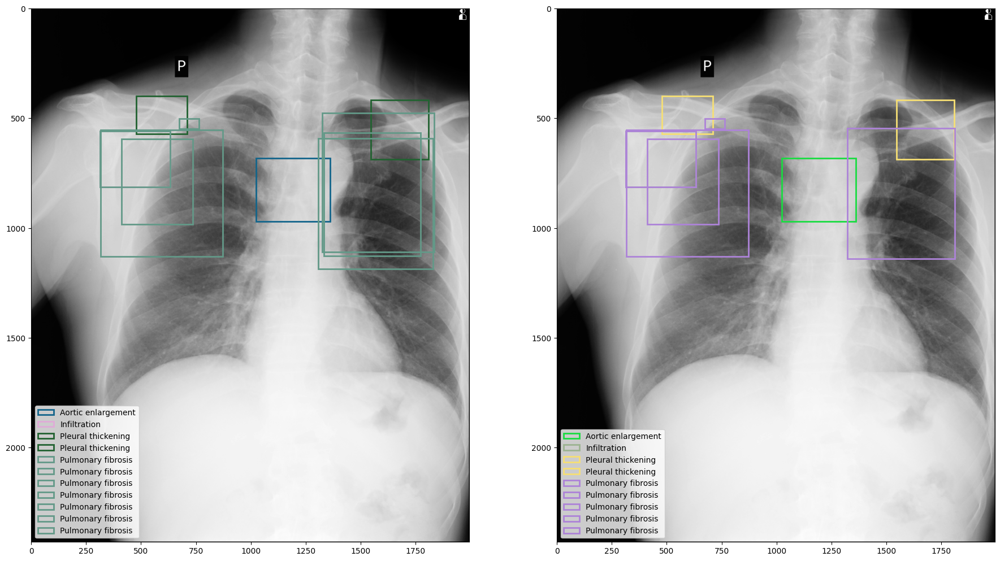

004d2bc2111d639f5e8441ced52d55cb


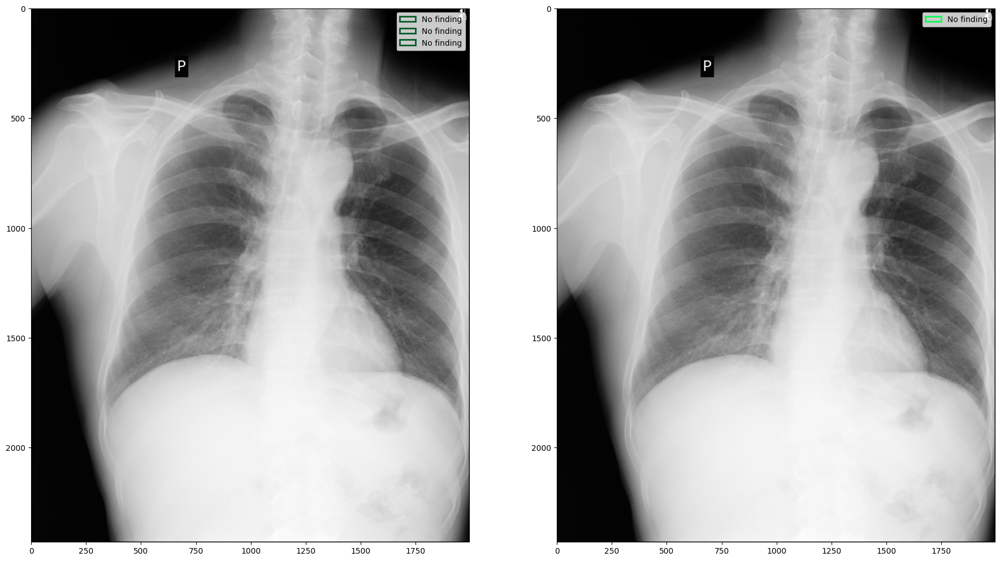

004dc2a50591fb5f1aaf012bffa95fd9


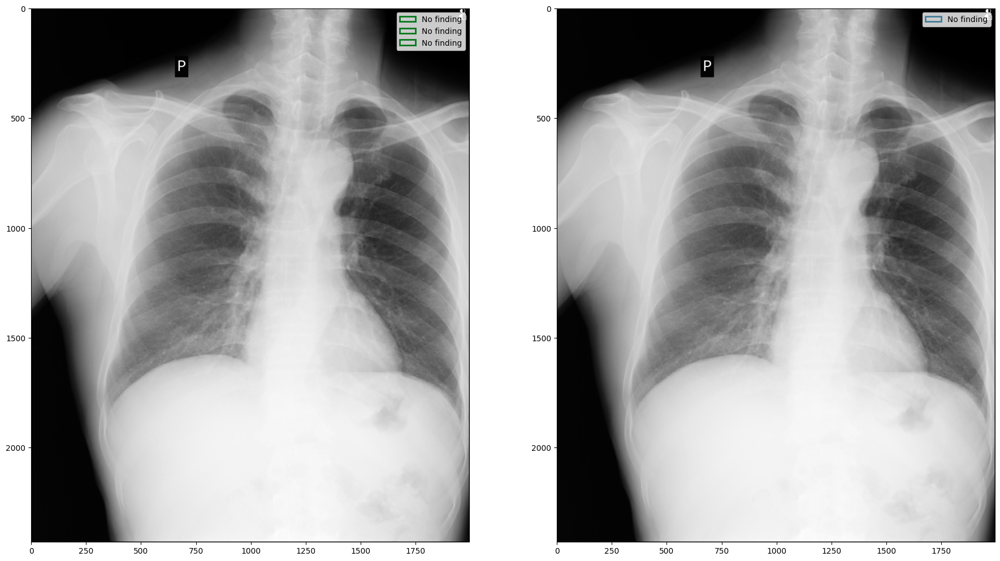

00575e3846ebd05a909d97ba59c53d30


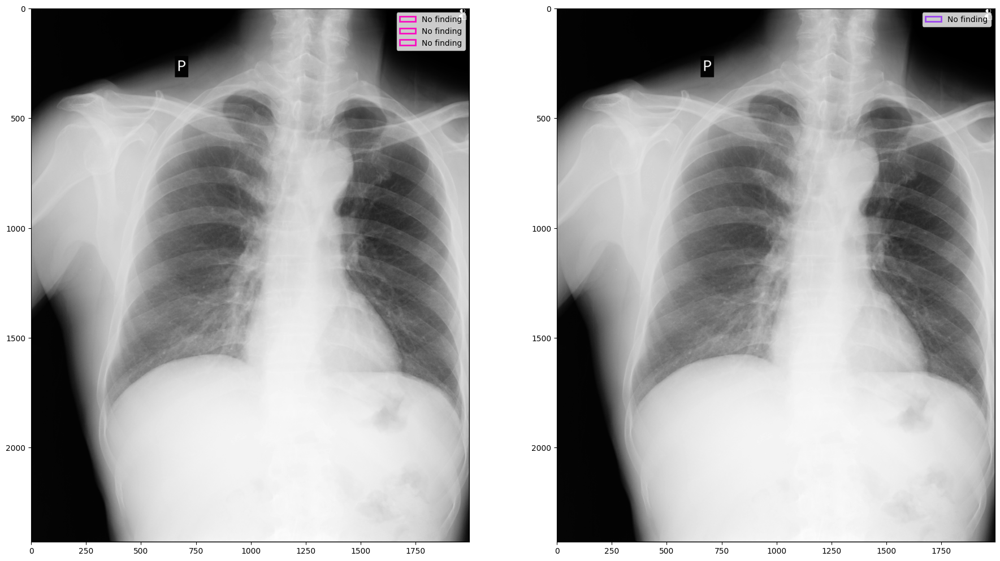

0059d21bef1793fa9522e4ec8cae1a1a


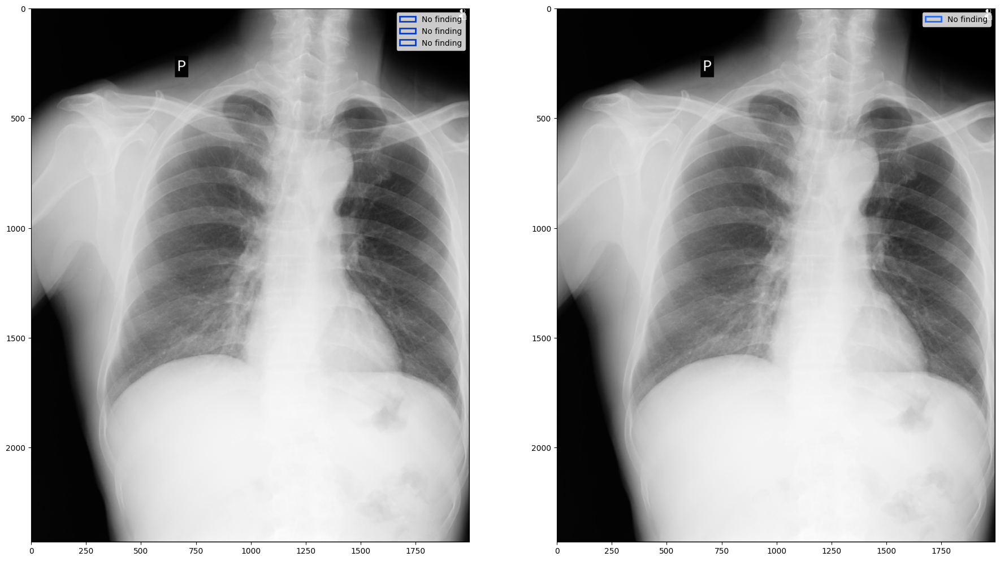

005be26a68485912e007a3703f43d60a


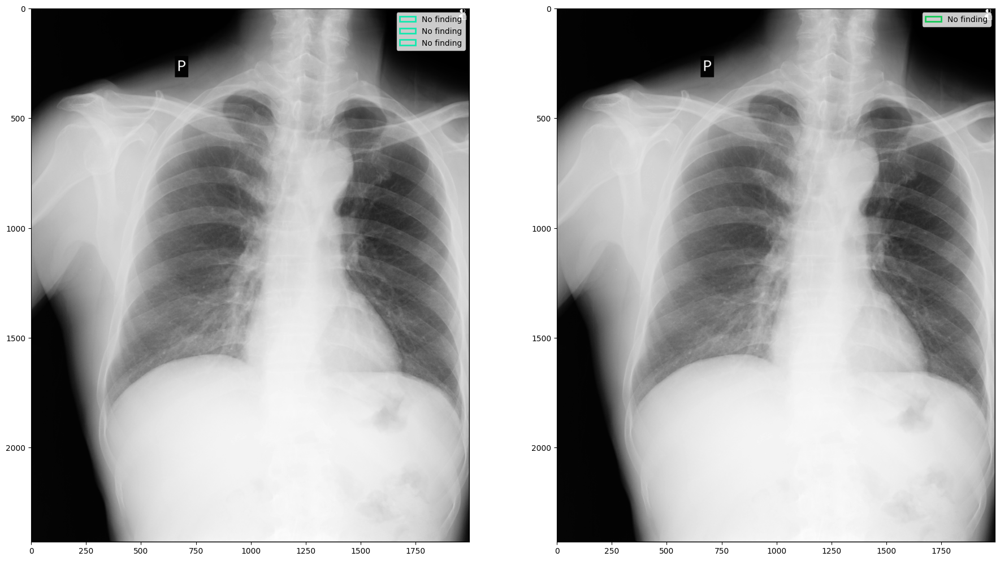

In [10]:
# Visualize.  Old on left, new on right

if False: # Only show images with >2 cardiomegalies or aortic enlargements
    t = train.loc[train.class_id.isin([0,3]),:].groupby('image_id').count().reset_index()
    image_ids = list(t.loc[t.class_name>1,:].image_id.unique())
else:
    image_ids = train.image_id.unique()

for image_id in image_ids[:20]:
    print(image_id)
    plot_scale_compare(image_id, train, train_fused)

In [8]:
#TODO
"There is mis-aligned bbox of images. Need to check further"

'There is mis-aligned bbox of images. Need to check further'

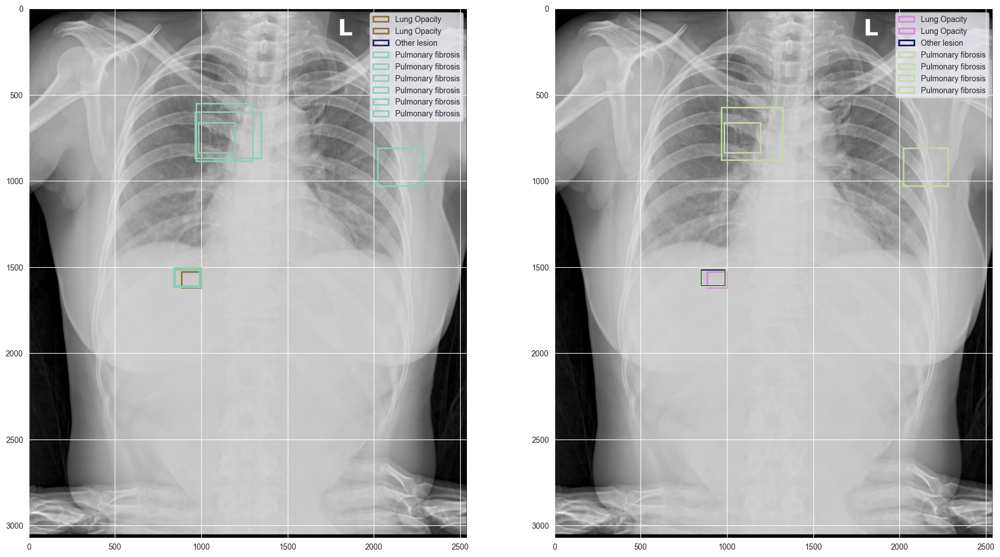

In [13]:
image_idr = "b76cca59757045fa3cedad238c878354"
plot_scale_compare(image_idr, train, train_fused)